# Calculate Betweenness Centrality (Before and After the Hurricane)

ToDO:
- Normalize Weights: Used normalize_weights function for "before" and "after" hurricane dates. 
- Compute Betweenness Centrality
- Identify Changes in Centrality

In [99]:
import networkx as nx
nx_ntl = nx.read_gml('county_graph_with_ntl.gml')

In [177]:
import networkx as nx
import json

def normalize_weights(graph, date_str):
    # Calculate the average ntl_sum for each edge
    for u, v in graph.edges():
        ntl_u = json.loads(graph.nodes[u]['ntl'])
        ntl_v = json.loads(graph.nodes[v]['ntl'])
        
        # Calculate the average ntl_sum for the two nodes
        avg_ntl_sum = (ntl_u[date_str][f'{date_str}_avg'] + ntl_v[date_str][f'{date_str}_avg']) / 2
        
        # Assign the average ntl_sum as the weight of the edge
        graph[u][v]['weight'] = avg_ntl_sum
    
    # Normalize the weights between 0 and 1
    weights = [graph[u][v]['weight'] for u, v in graph.edges()]
    min_weight = min(weights)
    max_weight = max(weights)
    
    for u, v in graph.edges():
        graph[u][v]['weight'] = 1 - ((graph[u][v]['weight'] - min_weight) / (max_weight - min_weight))

# Apply the function to the graph with a specific date
# normalize_weights(nx_ntl, '2023-09-01')

In [101]:
# check the weights
nx_ntl.edges(data=True)

EdgeDataView([('Georgia_Appling', 'Georgia_Bacon', {}), ('Georgia_Appling', 'Georgia_Jeff Davis', {}), ('Georgia_Appling', 'Georgia_Pierce', {}), ('Georgia_Appling', 'Georgia_Tattnall', {}), ('Georgia_Appling', 'Georgia_Toombs', {}), ('Georgia_Appling', 'Georgia_Wayne', {}), ('Georgia_Atkinson', 'Georgia_Berrien', {}), ('Georgia_Atkinson', 'Georgia_Clinch', {}), ('Georgia_Atkinson', 'Georgia_Coffee', {}), ('Georgia_Atkinson', 'Georgia_Lanier', {}), ('Georgia_Atkinson', 'Georgia_Ware', {}), ('Georgia_Bacon', 'Georgia_Coffee', {}), ('Georgia_Bacon', 'Georgia_Jeff Davis', {}), ('Georgia_Bacon', 'Georgia_Pierce', {}), ('Georgia_Bacon', 'Georgia_Ware', {}), ('Georgia_Baker', 'Georgia_Calhoun', {}), ('Georgia_Baker', 'Georgia_Decatur', {}), ('Georgia_Baker', 'Georgia_Dougherty', {}), ('Georgia_Baker', 'Georgia_Early', {}), ('Georgia_Baker', 'Georgia_Miller', {}), ('Georgia_Baker', 'Georgia_Mitchell', {}), ('Georgia_Baldwin', 'Georgia_Hancock', {}), ('Georgia_Baldwin', 'Georgia_Jones', {}), (

In [148]:
import networkx as nx

# Normalize weights for two time periods
normalize_weights(nx_ntl, '2023-09-25')  # Before hurricane
before_centrality = nx.betweenness_centrality(nx_ntl, weight='weight')

normalize_weights(nx_ntl, '2023-09-30')  # After hurricane
after_centrality = nx.betweenness_centrality(nx_ntl, weight='weight')

# Calculate change in centrality
centrality_change = {node: after_centrality[node] - before_centrality[node] for node in nx_ntl.nodes()}

# Identify regions with the largest changes
significant_changes = sorted(centrality_change.items(), key=lambda x: abs(x[1]), reverse=True)
print("Top changes in centrality:", significant_changes[:10])


Top changes in centrality: [('Georgia_Clayton', 0.044733410605621526), ('Georgia_DeKalb', 0.038273930261759875), ('Georgia_Lincoln', 0.026019028300975564), ('Georgia_Wilkes', -0.02009079493866512), ('Georgia_Atkinson', -0.011542548053704242), ('Georgia_Wilkinson', 0.009224379406935192), ('South Carolina_Pickens', -0.0091398628416884), ('Georgia_Twiggs', -0.00912778904665315), ('South Carolina_Anderson', 0.009091567661547381), ('Georgia_Ware', 0.006954505940307158)]


In [187]:
# check the weights
nx_ntl.edges(data=True)

EdgeDataView([('Georgia_Appling', 'Georgia_Bacon', {'weight': 0.9815741673498574}), ('Georgia_Appling', 'Georgia_Jeff Davis', {'weight': 0.9762856644830562}), ('Georgia_Appling', 'Georgia_Pierce', {'weight': 0.980365770822119}), ('Georgia_Appling', 'Georgia_Tattnall', {'weight': 0.9837044844273555}), ('Georgia_Appling', 'Georgia_Toombs', {'weight': 0.9732068961902408}), ('Georgia_Appling', 'Georgia_Wayne', {'weight': 0.9802712686622}), ('Georgia_Atkinson', 'Georgia_Berrien', {'weight': 0.9889601969042509}), ('Georgia_Atkinson', 'Georgia_Clinch', {'weight': 0.9923639616689854}), ('Georgia_Atkinson', 'Georgia_Coffee', {'weight': 0.9809577118754863}), ('Georgia_Atkinson', 'Georgia_Lanier', {'weight': 0.9883623463891696}), ('Georgia_Atkinson', 'Georgia_Ware', {'weight': 0.9872622590607681}), ('Georgia_Bacon', 'Georgia_Coffee', {'weight': 0.9774861601328033}), ('Georgia_Bacon', 'Georgia_Jeff Davis', {'weight': 0.9770144081762826}), ('Georgia_Bacon', 'Georgia_Pierce', {'weight': 0.9810945145

# Centrality Distribution

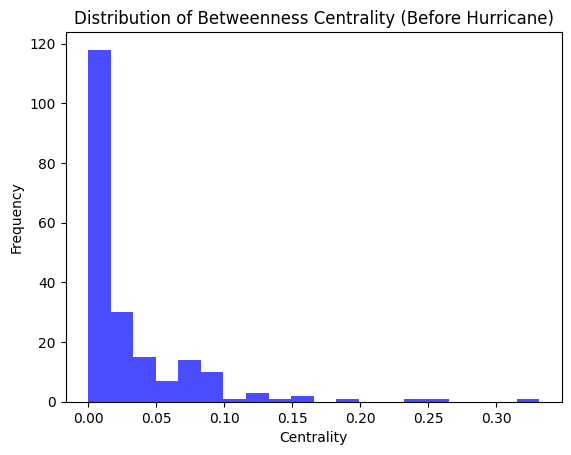

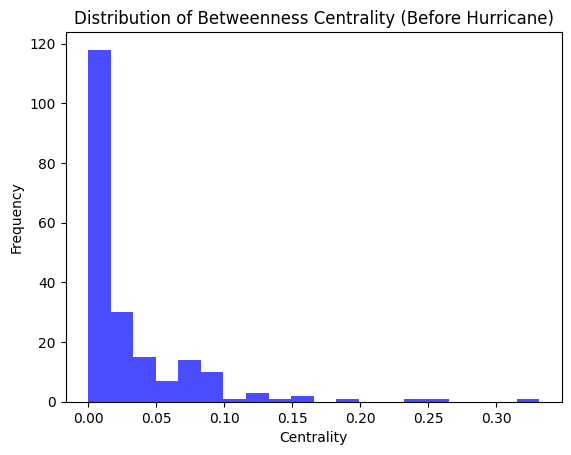

In [149]:
before_centrality = nx.betweenness_centrality(nx_ntl, weight='weight')

import matplotlib.pyplot as plt

# Extract centrality values for plotting
centrality_values = list(before_centrality.values())
plt.hist(centrality_values, bins=20, color='blue', alpha=0.7)
plt.title("Distribution of Betweenness Centrality (Before Hurricane)")
plt.xlabel("Centrality")
plt.ylabel("Frequency")
plt.show()

after_centrality = nx.betweenness_centrality(nx_ntl, weight='weight')

centrality_values = list(after_centrality.values())
plt.hist(centrality_values, bins=20, color='blue', alpha=0.7)
plt.title("Distribution of Betweenness Centrality (Before Hurricane)")
plt.xlabel("Centrality")
plt.ylabel("Frequency")
plt.show()



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


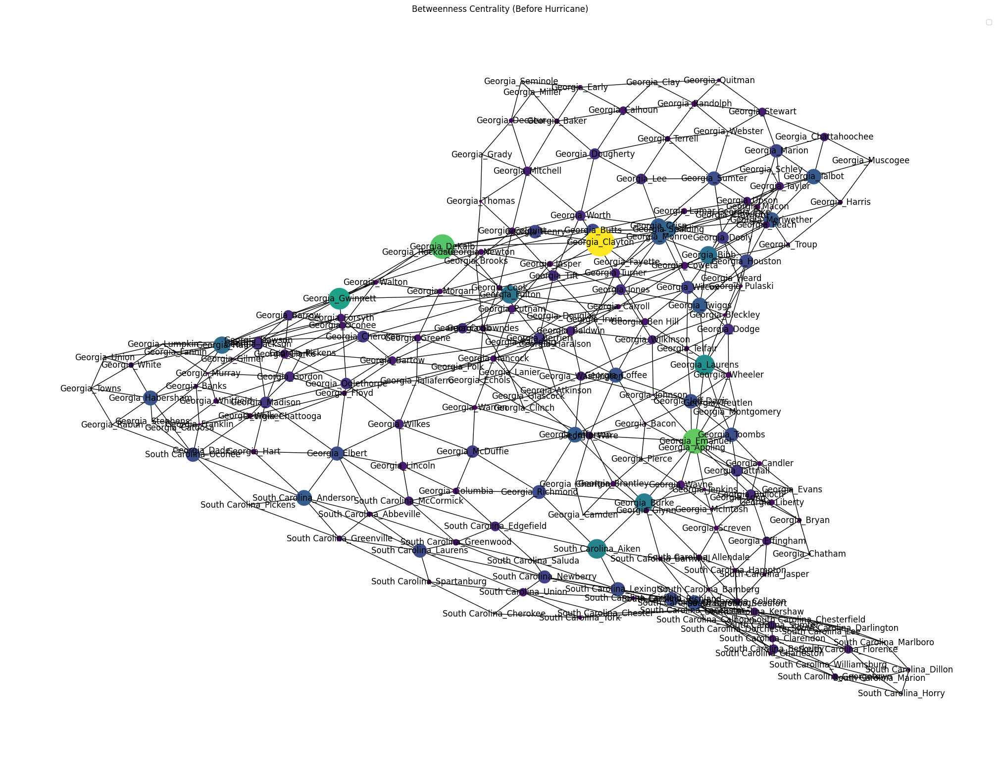

In [154]:
import networkx as nx
import matplotlib.pyplot as plt

pos = nx.spring_layout(nx_ntl, seed=22)  # or use a spatial layout if coordinates are available
centrality = before_centrality  # replace with after_centrality as needed

plt.figure(figsize=(20, 15))
nx.draw(
    nx_ntl, pos,
    with_labels=True,
    node_size=[5000 * centrality[node] for node in nx_ntl.nodes()],
    node_color=list(centrality.values()),
    cmap=plt.cm.viridis
)
plt.title("Betweenness Centrality (Before Hurricane)")
plt.show()


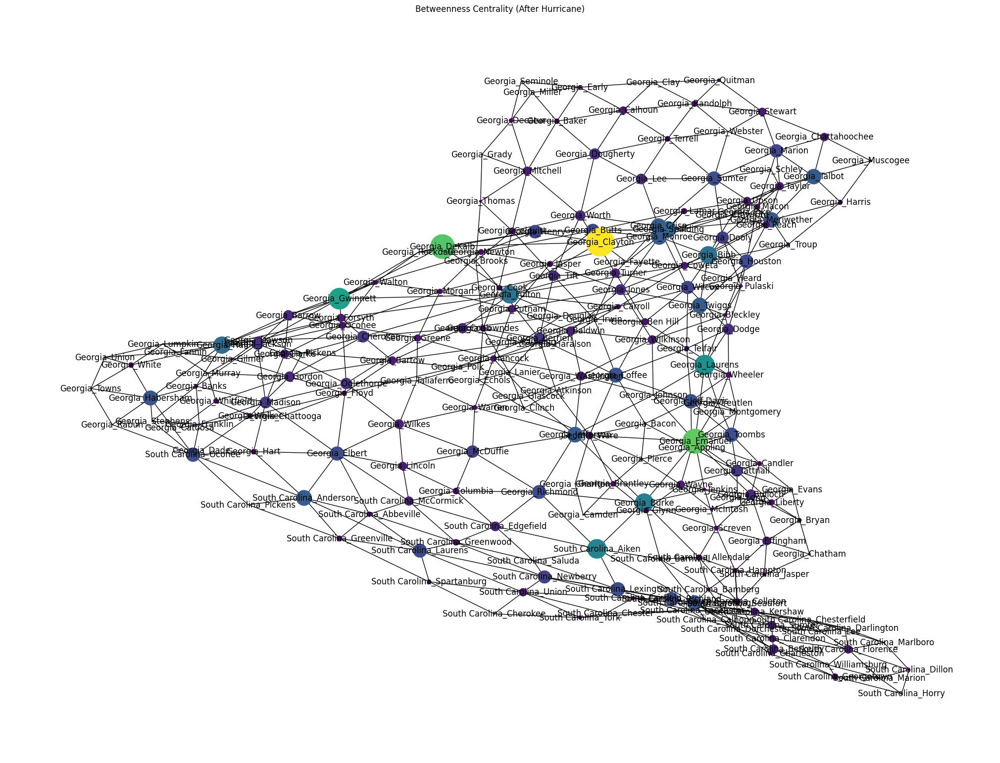

In [155]:
import networkx as nx
import matplotlib.pyplot as plt

pos = nx.spring_layout(nx_ntl, seed=22)  # or use a spatial layout if coordinates are available
centrality = after_centrality  # replace with after_centrality as needed

plt.figure(figsize=(20, 15))
nx.draw(
    nx_ntl, pos,
    with_labels=True,
    node_size=[5000 * centrality[node] for node in nx_ntl.nodes()],
    node_color=list(centrality.values()),
    cmap=plt.cm.viridis
)
plt.title("Betweenness Centrality (After Hurricane)")
plt.show()

In [158]:
import pandas as pd
import random

random.seed(42)
# Create random coordinates for each node (mockup for visualization purposes)
node_data = {'node_id': list(nx_ntl.nodes()), 'x': [], 'y': []}
for _ in range(len(node_data['node_id'])):
    node_data['x'].append(random.uniform(-85, -80))  # Longitude range for Georgia
    node_data['y'].append(random.uniform(30, 35))   # Latitude range for Georgia

regions = pd.DataFrame(node_data)
print(regions.head())


            node_id          x          y
0   Georgia_Appling -81.802866  30.125054
1  Georgia_Atkinson -83.624853  31.116054
2     Georgia_Bacon -81.317644  33.383497
3     Georgia_Baker -80.539102  30.434694
4   Georgia_Baldwin -82.890391  30.148986


# Betweenness Centrality Heatmap

 Heatmap Without GeoDataFrame

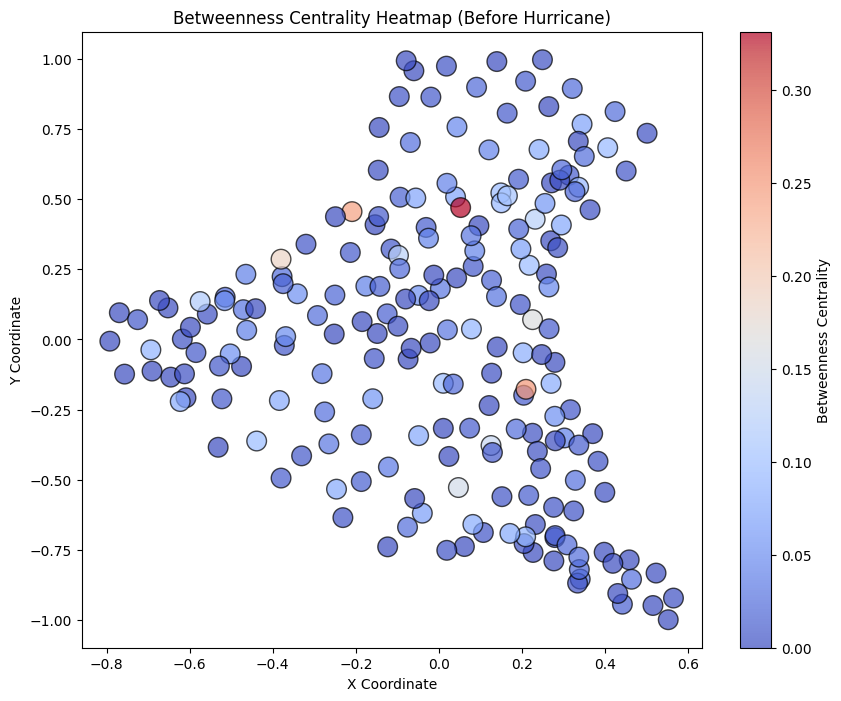

In [159]:
import matplotlib.pyplot as plt
import numpy as np
import networkx as nx

# Generate positions using spring layout
positions = nx.spring_layout(nx_ntl, seed=22)

# Prepare data for heatmap
x = [positions[node][0] for node in nx_ntl.nodes()]
y = [positions[node][1] for node in nx_ntl.nodes()]
centrality_values = list(before_centrality.values())

# Create scatter plot heatmap
plt.figure(figsize=(10, 8))
plt.scatter(x, y, c=centrality_values, cmap='coolwarm', s=200, edgecolor='k', alpha=0.7)
plt.colorbar(label='Betweenness Centrality')
plt.title("Betweenness Centrality Heatmap (Before Hurricane)")
plt.xlabel("X Coordinate")
plt.ylabel("Y Coordinate")
plt.show()


# How can I see which nodes are more in the center of the graph?

To identify the nodes that are more central in your graph, you can look at their betweenness centrality values. Nodes with higher betweenness centrality are more "central" because they lie on a larger number of shortest paths between other nodes

1. Identify Top Nodes by Centrality
2. Highlight Central Nodes in a Graph Visualization
3. Generate a Heatmap of Centrality
4. Compare Before and After Centrality
5. Visualize Centrality Changes

In [ ]:
# Sort nodes by centrality values (descending)
sorted_centrality = sorted(before_centrality.items(), key=lambda x: x[1], reverse=True)

# Top 10 most central nodes
top_central_nodes = sorted_centrality[:10]
print("Top 10 nodes by betweenness centrality (before hurricane):")
for node, centrality in top_central_nodes:
    print(f"{node}: {centrality:.4f}")


Top 10 nodes by betweenness centrality (before hurricane):
Georgia_Clayton: 0.3314
Georgia_Emanuel: 0.2500
Georgia_DeKalb: 0.2430
Georgia_Gwinnett: 0.1868
Georgia_Laurens: 0.1635
South Carolina_Aiken: 0.1505
Georgia_Burke: 0.1392
Georgia_Fulton: 0.1263
Georgia_Bibb: 0.1239
Georgia_Hall: 0.1161


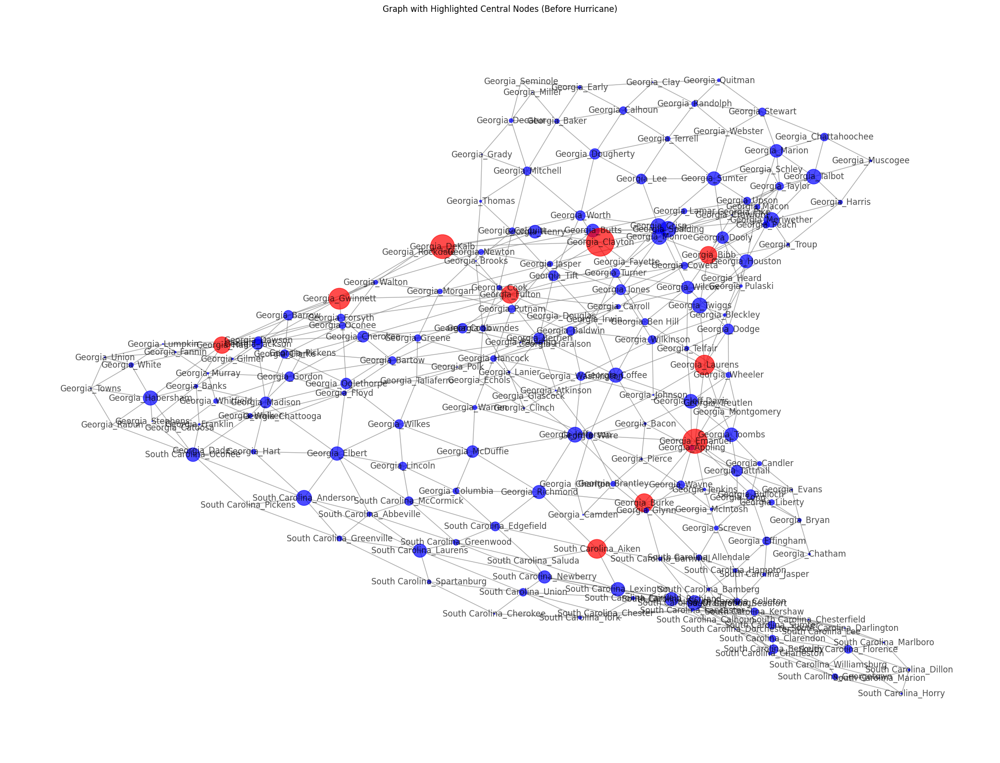

In [ ]:
import matplotlib.pyplot as plt

# Generate positions for the graph
pos = nx.spring_layout(nx_ntl, seed=22)

# Extract centrality values
centrality = before_centrality

# Highlight top 10 central nodes
top_nodes = {node for node, _ in top_central_nodes}
node_color = ['red' if node in top_nodes else 'blue' for node in nx_ntl.nodes()]
node_size = [5000 * centrality[node] for node in nx_ntl.nodes()]

# Draw the graph
plt.figure(figsize=(20, 15))
nx.draw(
    nx_ntl, pos,
    with_labels=True,
    node_size=node_size,
    node_color=node_color,
    edge_color="gray",
    alpha=0.7,
)
plt.title("Graph with Highlighted Central Nodes (Before Hurricane)")
plt.show()


In [ ]:
# # Sort nodes by centrality values (descending)
# sorted_centrality = sorted(after_centrality.items(), key=lambda x: x[1], reverse=True)

# # Top 10 most central nodes
# top_central_nodes = sorted_centrality[:10]
# print("Top 10 nodes by betweenness centrality (after hurricane):")
# for node, centrality in top_central_nodes:
#     print(f"{node}: {centrality:.4f}")



# Sort nodes by centrality values (descending) for after hurricane
sorted_after_centrality = sorted(after_centrality.items(), key=lambda x: x[1], reverse=True)

# Top 10 most central nodes
top_after_central_nodes = sorted_after_centrality[:10]
print("Top 10 nodes by betweenness centrality (after hurricane):")
for node, centrality in top_after_central_nodes:
    print(f"{node}: {centrality:.4f}")


Top 10 nodes by betweenness centrality (after hurricane):
Georgia_Clayton: 0.3314
Georgia_Emanuel: 0.2500
Georgia_DeKalb: 0.2430
Georgia_Gwinnett: 0.1868
Georgia_Laurens: 0.1635
South Carolina_Aiken: 0.1505
Georgia_Burke: 0.1392
Georgia_Fulton: 0.1263
Georgia_Bibb: 0.1239
Georgia_Hall: 0.1161


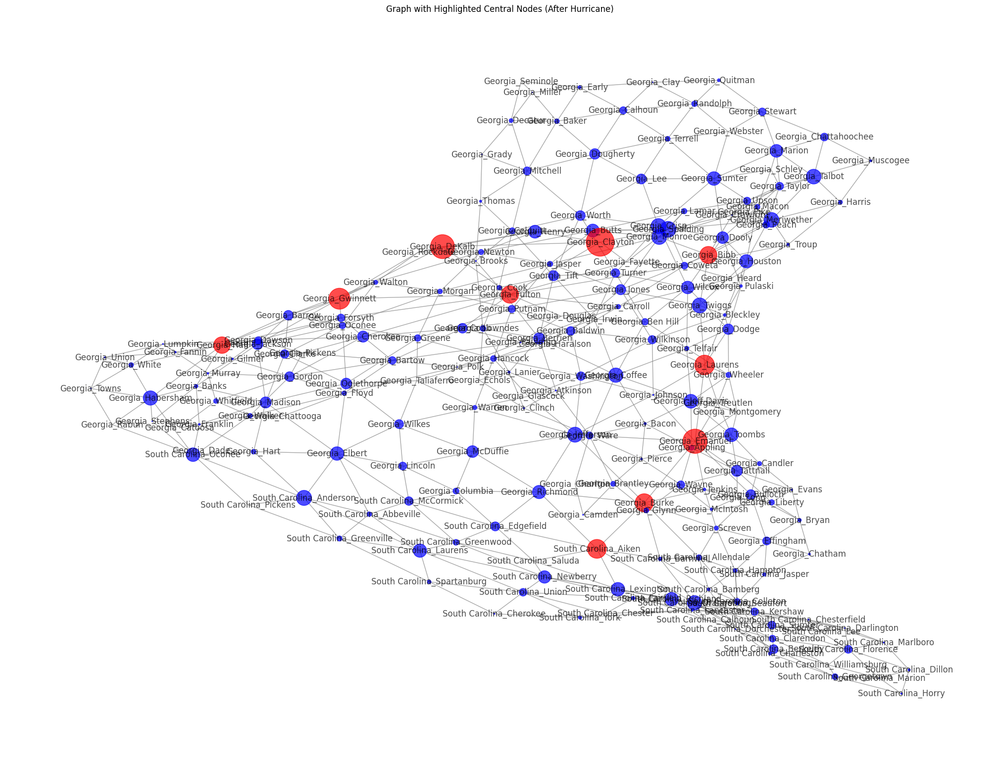

In [ ]:
import matplotlib.pyplot as plt

# Generate positions for the graph
pos = nx.spring_layout(nx_ntl, seed=22)

# Extract centrality values
centrality = after_centrality

# Highlight top 10 central nodes
top_nodes = {node for node, _ in top_central_nodes}
node_color = ['red' if node in top_nodes else 'blue' for node in nx_ntl.nodes()]
node_size = [5000 * centrality[node] for node in nx_ntl.nodes()]

# Draw the graph
plt.figure(figsize=(20, 15))
nx.draw(
    nx_ntl, pos,
    with_labels=True,
    node_size=node_size,
    node_color=node_color,
    edge_color="gray",
    alpha=0.7,
)
plt.title("Graph with Highlighted Central Nodes (After Hurricane)")
plt.show()


# Centrality Analysis

In [172]:
# Calculate centrality metrics
closeness_centrality = nx.closeness_centrality(nx_ntl, distance='weight')
eigenvector_centrality = nx.eigenvector_centrality(nx_ntl, weight='weight')
betweenness_centrality = nx.betweenness_centrality(nx_ntl, weight='weight')

# Sort and display top nodes by centrality metrics
top_closeness = sorted(closeness_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
top_eigenvector = sorted(eigenvector_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
top_betwenness = sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)[:10]

print("Top 10 nodes by closeness centrality:")
for node, centrality in top_closeness:
    print(f"{node}: {centrality:.4f}")

print("\nTop 10 nodes by eigenvector centrality:")
for node, centrality in top_eigenvector:
    print(f"{node}: {centrality:.4f}")

print("\nTop 10 nodes by betweenness centrality:")
for node, centrality in top_betwenness:
    print(f"{node}: {centrality:.4f}")


Top 10 nodes by closeness centrality:
Georgia_Laurens: 0.2195
Georgia_Twiggs: 0.2183
Georgia_Emanuel: 0.2170
Georgia_Bibb: 0.2164
Georgia_Jones: 0.2140
Georgia_Wilkinson: 0.2139
Georgia_Johnson: 0.2135
Georgia_Jefferson: 0.2132
Georgia_Washington: 0.2099
Georgia_Houston: 0.2094

Top 10 nodes by eigenvector centrality:
Georgia_Emanuel: 0.3438
Georgia_Laurens: 0.2377
Georgia_Toombs: 0.2272
Georgia_Treutlen: 0.2235
Georgia_Johnson: 0.2092
Georgia_Tattnall: 0.1980
Georgia_Jefferson: 0.1939
Georgia_Montgomery: 0.1836
Georgia_Burke: 0.1831
Georgia_Wheeler: 0.1717

Top 10 nodes by betweenness centrality:
Georgia_Clayton: 0.3314
Georgia_Emanuel: 0.2500
Georgia_DeKalb: 0.2430
Georgia_Gwinnett: 0.1868
Georgia_Laurens: 0.1635
South Carolina_Aiken: 0.1505
Georgia_Burke: 0.1392
Georgia_Fulton: 0.1263
Georgia_Bibb: 0.1239
Georgia_Hall: 0.1161


# Community Detection

In [173]:
from networkx.algorithms.community import greedy_modularity_communities

# Detect communities using modularity-based clustering
communities = list(greedy_modularity_communities(nx_ntl, weight='weight'))

# Display detected communities
print("\nDetected Communities:")
for i, community in enumerate(communities):
    print(f"Community {i + 1}: {list(community)}")



Detected Communities:
Community 1: ['South Carolina_Darlington', 'South Carolina_Lexington', 'South Carolina_Bamberg', 'South Carolina_Barnwell', 'South Carolina_Berkeley', 'South Carolina_Sumter', 'Georgia_Lincoln', 'South Carolina_Allendale', 'South Carolina_Saluda', 'South Carolina_Laurens', 'South Carolina_Dillon', 'South Carolina_Orangeburg', 'South Carolina_Calhoun', 'South Carolina_Abbeville', 'South Carolina_Chester', 'South Carolina_Charleston', 'South Carolina_Fairfield', 'South Carolina_Georgetown', 'South Carolina_Marlboro', 'South Carolina_Lee', 'South Carolina_Kershaw', 'South Carolina_Colleton', 'South Carolina_Spartanburg', 'Georgia_Columbia', 'South Carolina_Chesterfield', 'South Carolina_Aiken', 'South Carolina_Florence', 'South Carolina_Dorchester', 'South Carolina_Williamsburg', 'South Carolina_Hampton', 'South Carolina_Edgefield', 'Georgia_Screven', 'Georgia_Richmond', 'South Carolina_Cherokee', 'South Carolina_Marion', 'South Carolina_Greenville', 'South Carolina

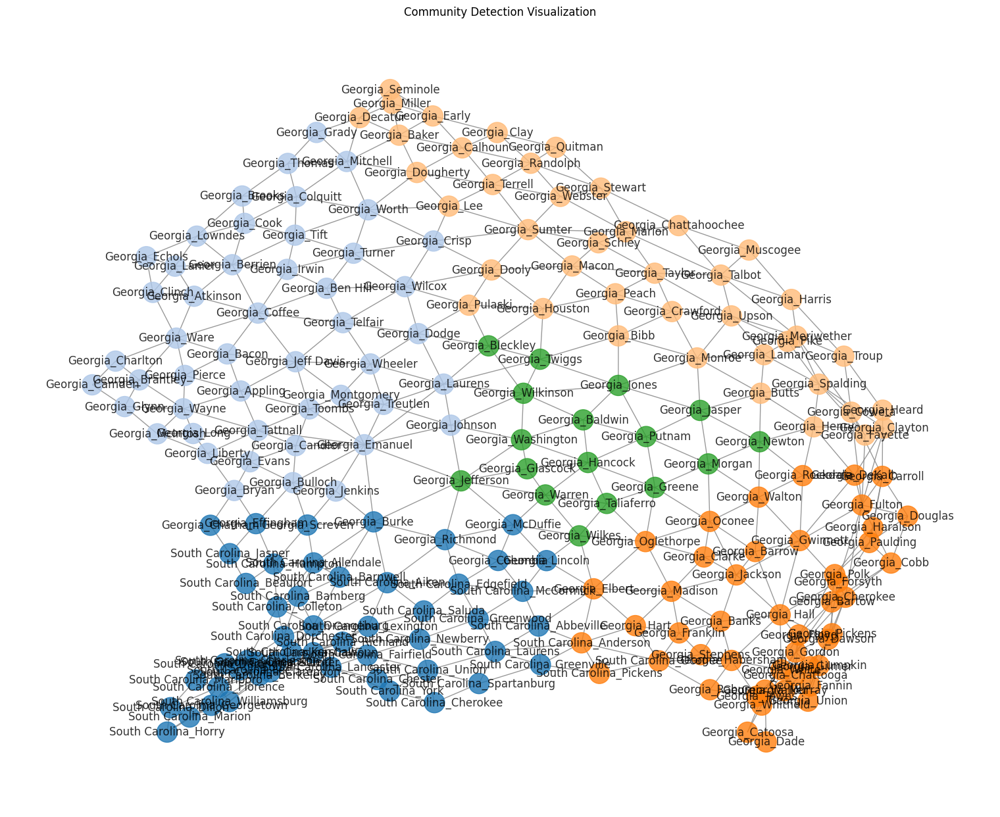

In [174]:
# plot
import matplotlib.pyplot as plt
import itertools

# Assign colors to communities
community_colors = itertools.cycle(plt.cm.tab20.colors)  # Use a colormap with sufficient distinct colors
community_map = {node: i for i, community in enumerate(communities) for node in community}

# Create node color mapping based on community membership
node_color = [community_colors.__next__() for _ in range(len(communities))]
node_colors = [node_color[community_map[node]] for node in nx_ntl.nodes()]

# Generate graph layout
pos = nx.spring_layout(nx_ntl, seed=42)

# Draw graph with community colors
plt.figure(figsize=(15, 12))
nx.draw(
    nx_ntl, pos,
    with_labels=True,
    node_color=node_colors,
    node_size=500,
    edge_color="gray",
    alpha=0.8
)
plt.title("Community Detection Visualization")
plt.show()


# Edge Analysis

In [128]:
# Find the strongest edges (top 10 by weight)
strongest_edges = sorted(nx_ntl.edges(data=True), key=lambda x: x[2]['weight'], reverse=True)[:20]

print("\nTop 10 strongest edges (by weight):")
for u, v, data in strongest_edges:
    print(f"{u} - {v}: {data['weight']:.4f}")



Top 10 strongest edges (by weight):
Georgia_Taliaferro - Georgia_Wilkes: 1.0000
Georgia_Oglethorpe - Georgia_Taliaferro: 0.9999
Georgia_Lincoln - South Carolina_McCormick: 0.9999
Georgia_Oglethorpe - Georgia_Wilkes: 0.9988
Georgia_Lincoln - Georgia_Wilkes: 0.9988
Georgia_Hancock - Georgia_Taliaferro: 0.9981
Georgia_Clinch - Georgia_Echols: 0.9974
Georgia_Taliaferro - Georgia_Warren: 0.9970
Georgia_Treutlen - Georgia_Wheeler: 0.9965
Georgia_Greene - Georgia_Taliaferro: 0.9960
Georgia_Warren - Georgia_Wilkes: 0.9959
Georgia_Elbert - South Carolina_McCormick: 0.9953
Georgia_Glascock - Georgia_Hancock: 0.9952
Georgia_Montgomery - Georgia_Wheeler: 0.9951
Georgia_Montgomery - Georgia_Treutlen: 0.9948
Georgia_Greene - Georgia_Oglethorpe: 0.9948
South Carolina_Abbeville - South Carolina_McCormick: 0.9948
Georgia_Long - Georgia_McIntosh: 0.9946
Georgia_Dodge - Georgia_Wheeler: 0.9945
Georgia_Rabun - Georgia_Towns: 0.9942


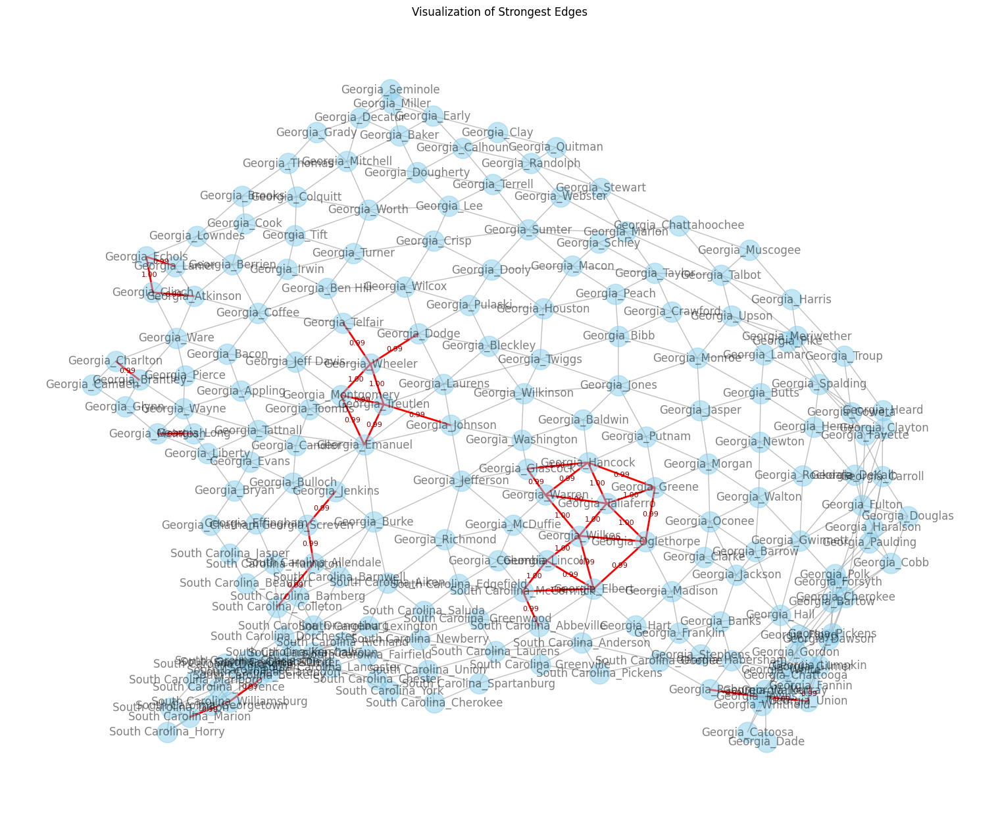

In [175]:
import matplotlib.pyplot as plt

# Get positions for the nodes
pos = nx.spring_layout(nx_ntl, seed=42)

# Find the strongest edges (already sorted in your code)
strongest_edges = sorted(nx_ntl.edges(data=True), key=lambda x: x[2]['weight'], reverse=True)[:40]
strongest_edge_set = {(u, v) for u, v, data in strongest_edges}

# Draw the entire graph with lighter edges
plt.figure(figsize=(15, 12))
nx.draw(
    nx_ntl, pos,
    with_labels=True,
    node_size=500,
    node_color="skyblue",
    edge_color="gray",
    alpha=0.5
)

# Highlight the strongest edges
nx.draw_networkx_edges(
    nx_ntl, pos,
    edgelist=strongest_edge_set,
    edge_color="red",
    width=2
)

# Annotate the strongest edges with weights
for u, v, data in strongest_edges:
    x, y = (pos[u] + pos[v]) / 2  # Midpoint of the edge
    plt.text(x, y, f"{data['weight']:.2f}", fontsize=8, color="darkred", ha="center", va="center")

plt.title("Visualization of Strongest Edges")
plt.show()


# Changes in Network Structure: Before vs After

In [170]:
## NEW

# Define the function to calculate and print shortest path lengths for two dates
def calculate_shortest_path_lengths(graph, date_before, date_after):
    # Normalize weights for both dates
    normalize_weights(graph, date_before)  # Normalize for before hurricane
    avg_path_length_before = nx.average_shortest_path_length(graph, weight='weight')
    
    normalize_weights(graph, date_after)  # Normalize for after hurricane
    avg_path_length_after = nx.average_shortest_path_length(graph, weight='weight')
    
    # Print results
    print("\nAverage Shortest Path Length:")
    print(f"Before Hurricane (Date: {date_before}): {avg_path_length_before:.4f}")
    print(f"After Hurricane (Date: {date_after}): {avg_path_length_after:.4f}")

# Example usage: 
# You can now call the function and pass in the dates you want to compare (e.g., '2023-09-25' and '2023-09-30')
calculate_shortest_path_lengths(nx_ntl, '2023-09-25', '2023-09-30')


Average Shortest Path Length:
Before Hurricane (Date: 2023-09-25): 5.9582
After Hurricane (Date: 2023-09-30): 6.0016


# Heatmaps

### All changes - too dense

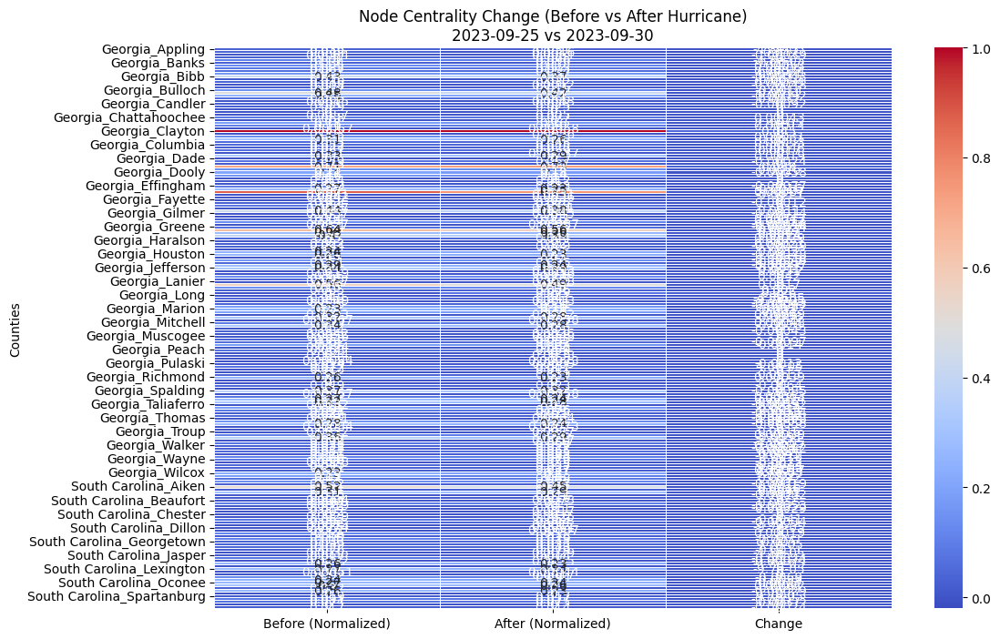

In [181]:
import networkx as nx
import json
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Heatmap generation function for two dates
def calculate_and_plot_heatmap(graph, date_before, date_after):
    # Normalize weights for each time period
    normalize_weights(graph, date_before)
    before_centrality = nx.betweenness_centrality(graph, weight='weight')

    normalize_weights(graph, date_after)
    after_centrality = nx.betweenness_centrality(graph, weight='weight')

    # Prepare data for heatmap
    nodes = list(graph.nodes())
    before_values = [before_centrality[node] for node in nodes]
    after_values = [after_centrality[node] for node in nodes]

    # Create a DataFrame
    df = pd.DataFrame({
        'Node': nodes,
        f'Before ({date_before})': before_values,
        f'After ({date_after})': after_values,
        'Change': [after_values[i] - before_values[i] for i in range(len(nodes))]
    })

    # Normalize centrality values for better heatmap contrast
    df['Before (Normalized)'] = (df[f'Before ({date_before})'] - min(before_values)) / (max(before_values) - min(before_values))
    df['After (Normalized)'] = (df[f'After ({date_after})'] - min(after_values)) / (max(after_values) - min(after_values))

    # Prepare heatmap data
    heatmap_data = df.set_index('Node')  # Set 'Node' as index

    # Plot heatmap
    plt.figure(figsize=(12, 8))
    sns.heatmap(
        heatmap_data[['Before (Normalized)', 'After (Normalized)', 'Change']],
        annot=True, cmap='coolwarm', linewidths=0.5
    )
    plt.title(f"Node Centrality Change (Before vs After Hurricane)\n{date_before} vs {date_after}")
    plt.ylabel("Counties")
    plt.show()

# Example usage
# Ensure your graph `nx_ntl` is properly loaded with node and edge data
calculate_and_plot_heatmap(nx_ntl, '2023-09-25', '2023-09-30')

### Top N node centrality changes - Visualization

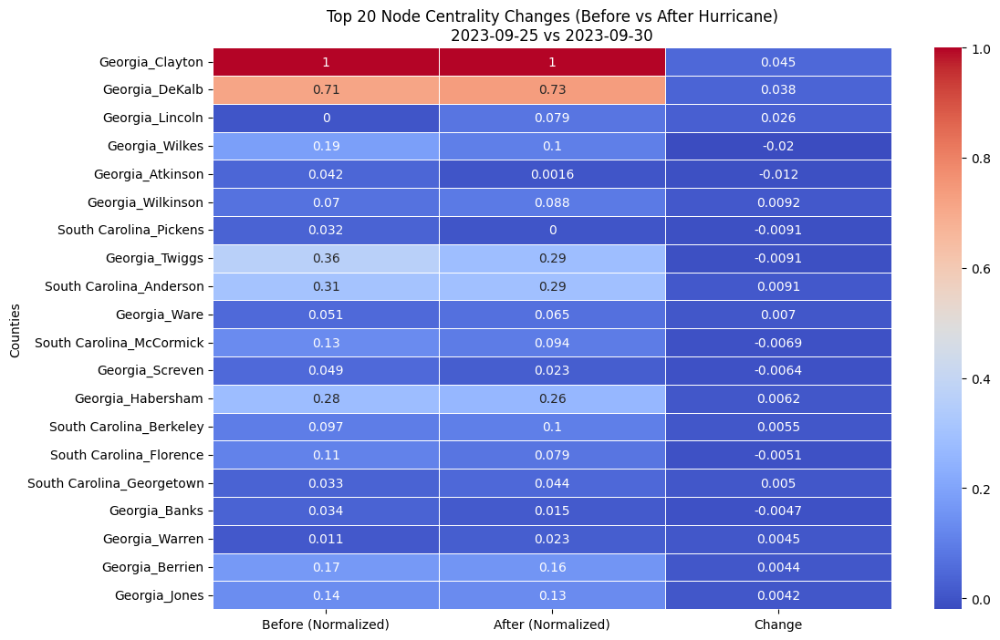

In [ ]:
#Filter Top Nodes
def calculate_and_plot_heatmap_filtered(graph, date_before, date_after, top_n=20):
    # Normalize weights for each time period
    normalize_weights(graph, date_before)
    before_centrality = nx.betweenness_centrality(graph, weight='weight')

    normalize_weights(graph, date_after)
    after_centrality = nx.betweenness_centrality(graph, weight='weight')

    # Calculate changes and filter top nodes
    centrality_change = {node: after_centrality[node] - before_centrality[node] for node in graph.nodes()}
    top_nodes = sorted(centrality_change.keys(), key=lambda x: abs(centrality_change[x]), reverse=True)[:top_n]

    # Prepare data for heatmap
    df = pd.DataFrame({
        'Node': top_nodes,
        f'Before ({date_before})': [before_centrality[node] for node in top_nodes],
        f'After ({date_after})': [after_centrality[node] for node in top_nodes],
        'Change': [centrality_change[node] for node in top_nodes]
    })

    # Normalize centrality values for better heatmap contrast
    df['Before (Normalized)'] = (df[f'Before ({date_before})'] - df[f'Before ({date_before})'].min()) / (
                df[f'Before ({date_before})'].max() - df[f'Before ({date_before})'].min())
    df['After (Normalized)'] = (df[f'After ({date_after})'] - df[f'After ({date_after})'].min()) / (
                df[f'After ({date_after})'].max() - df[f'After ({date_after})'].min())

    # Plot heatmap
    plt.figure(figsize=(12, 8))
    sns.heatmap(
        df.set_index('Node')[['Before (Normalized)', 'After (Normalized)', 'Change']],
        annot=True, cmap='coolwarm', linewidths=0.5
    )
    plt.title(f"Top {top_n} Node Centrality Changes (Before vs After Hurricane)\n{date_before} vs {date_after}")
    plt.ylabel("Counties")
    plt.show()

# Example usage
calculate_and_plot_heatmap_filtered(nx_ntl, '2023-09-25', '2023-09-30', top_n=20)


### Community-Level Visualization


Detected Communities:
Community 1: ['South Carolina_Darlington', 'South Carolina_Lexington', 'South Carolina_Bamberg', 'South Carolina_Barnwell', 'South Carolina_Berkeley', 'South Carolina_Sumter', 'Georgia_Lincoln', 'South Carolina_Allendale', 'South Carolina_Saluda', 'South Carolina_Laurens', 'South Carolina_Dillon', 'South Carolina_Orangeburg', 'South Carolina_Calhoun', 'South Carolina_Abbeville', 'South Carolina_Chester', 'South Carolina_Charleston', 'South Carolina_Fairfield', 'South Carolina_Georgetown', 'South Carolina_Marlboro', 'South Carolina_Lee', 'South Carolina_Kershaw', 'South Carolina_Colleton', 'South Carolina_Spartanburg', 'Georgia_Columbia', 'South Carolina_Chesterfield', 'South Carolina_Aiken', 'South Carolina_Florence', 'South Carolina_Dorchester', 'South Carolina_Williamsburg', 'South Carolina_Hampton', 'South Carolina_Edgefield', 'Georgia_Screven', 'Georgia_Richmond', 'South Carolina_Cherokee', 'South Carolina_Marion', 'South Carolina_Greenville', 'South Carolina

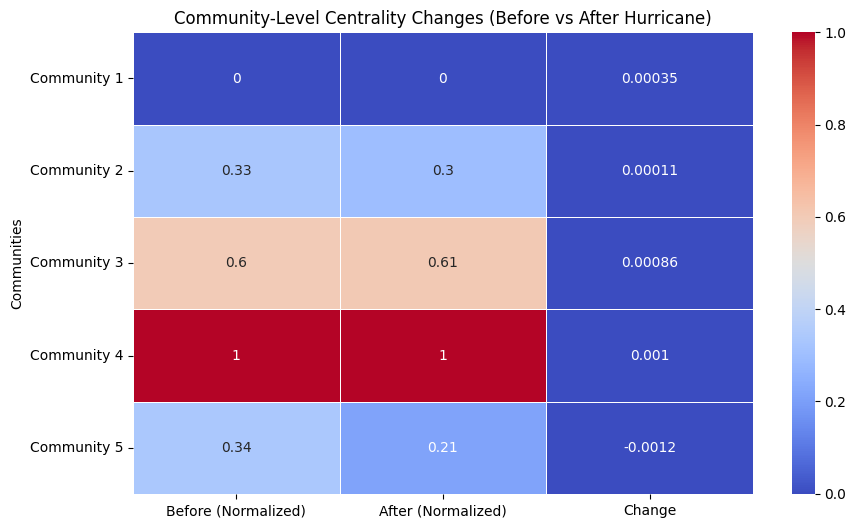

In [ ]:
# Community-Level Visualization

from networkx.algorithms.community import greedy_modularity_communities

def plot_community_heatmap_and_list(graph, date_before, date_after):
    # normalize weights and calculate centrality
    normalize_weights(graph, date_before)
    before_centrality = nx.betweenness_centrality(graph, weight='weight')

    normalize_weights(graph, date_after)
    after_centrality = nx.betweenness_centrality(graph, weight='weight')

    # detect communities
    communities = list(greedy_modularity_communities(graph, weight='weight'))

    # display community details
    print("\nDetected Communities:")
    community_overview = []
    for i, community in enumerate(communities):
        community_members = list(community)
        print(f"Community {i + 1}: {community_members}")
        community_overview.append({
            'Community': f'Community {i + 1}',
            'Members': community_members
        })

    # aggregate by community for heatmap
    community_data = []
    for i, community in enumerate(communities):
        community_nodes = list(community)
        avg_before = sum(before_centrality[node] for node in community_nodes) / len(community_nodes)
        avg_after = sum(after_centrality[node] for node in community_nodes) / len(community_nodes)
        community_data.append({
            'Community': f'Community {i + 1}',
            f'Before ({date_before})': avg_before,
            f'After ({date_after})': avg_after,
            'Change': avg_after - avg_before
        })

    # DataFrame for heatmap
    df = pd.DataFrame(community_data)

    # normalize values for visualization
    if not df.empty:
        df['Before (Normalized)'] = (df[f'Before ({date_before})'] - df[f'Before ({date_before})'].min()) / \
                                    (df[f'Before ({date_before})'].max() - df[f'Before ({date_before})'].min())
        df['After (Normalized)'] = (df[f'After ({date_after})'] - df[f'After ({date_after})'].min()) / \
                                   (df[f'After ({date_after})'].max() - df[f'After ({date_after})'].min())

        # heatmap
        plt.figure(figsize=(10, 6))
        sns.heatmap(
            df.set_index('Community')[['Before (Normalized)', 'After (Normalized)', 'Change']],
            annot=True, cmap='coolwarm', linewidths=0.5
        )
        plt.title(f"Community-Level Centrality Changes (Before vs After Hurricane)")
        plt.ylabel("Communities")
        plt.show()
    else:
        print("DataFrame is empty. Check your community detection or centrality calculations.")

    # return the community list 
    return community_overview


community_list = plot_community_heatmap_and_list(nx_ntl, '2023-09-25', '2023-09-30')


# Removing nodes and its impact on neighbouring counties
### Economic Impact?

=> Generate two visualizations of the impact of removing nodes and edges on two different dates:

Steps to follow:
- Compute the initial centrality for both dates.
- Simulate the removal of nodes & edge  and recalculate centrality for each date.
- Visualize the impact for each date in separate plots.

## Removing 2 nodes in the graph

Nodes in the graph before removal: ['Georgia_Appling', 'Georgia_Atkinson', 'Georgia_Bacon', 'Georgia_Baker', 'Georgia_Baldwin', 'Georgia_Banks', 'Georgia_Barrow', 'Georgia_Bartow', 'Georgia_Ben Hill', 'Georgia_Berrien', 'Georgia_Bibb', 'Georgia_Bleckley', 'Georgia_Brantley', 'Georgia_Brooks', 'Georgia_Bryan', 'Georgia_Bulloch', 'Georgia_Burke', 'Georgia_Butts', 'Georgia_Calhoun', 'Georgia_Camden', 'Georgia_Candler', 'Georgia_Carroll', 'Georgia_Catoosa', 'Georgia_Charlton', 'Georgia_Chatham', 'Georgia_Chattahoochee', 'Georgia_Chattooga', 'Georgia_Cherokee', 'Georgia_Clarke', 'Georgia_Clay', 'Georgia_Clayton', 'Georgia_Clinch', 'Georgia_Cobb', 'Georgia_Coffee', 'Georgia_Colquitt', 'Georgia_Columbia', 'Georgia_Cook', 'Georgia_Coweta', 'Georgia_Crawford', 'Georgia_Crisp', 'Georgia_Dade', 'Georgia_Dawson', 'Georgia_Decatur', 'Georgia_DeKalb', 'Georgia_Dodge', 'Georgia_Dooly', 'Georgia_Dougherty', 'Georgia_Douglas', 'Georgia_Early', 'Georgia_Echols', 'Georgia_Effingham', 'Georgia_Elbert', 'G

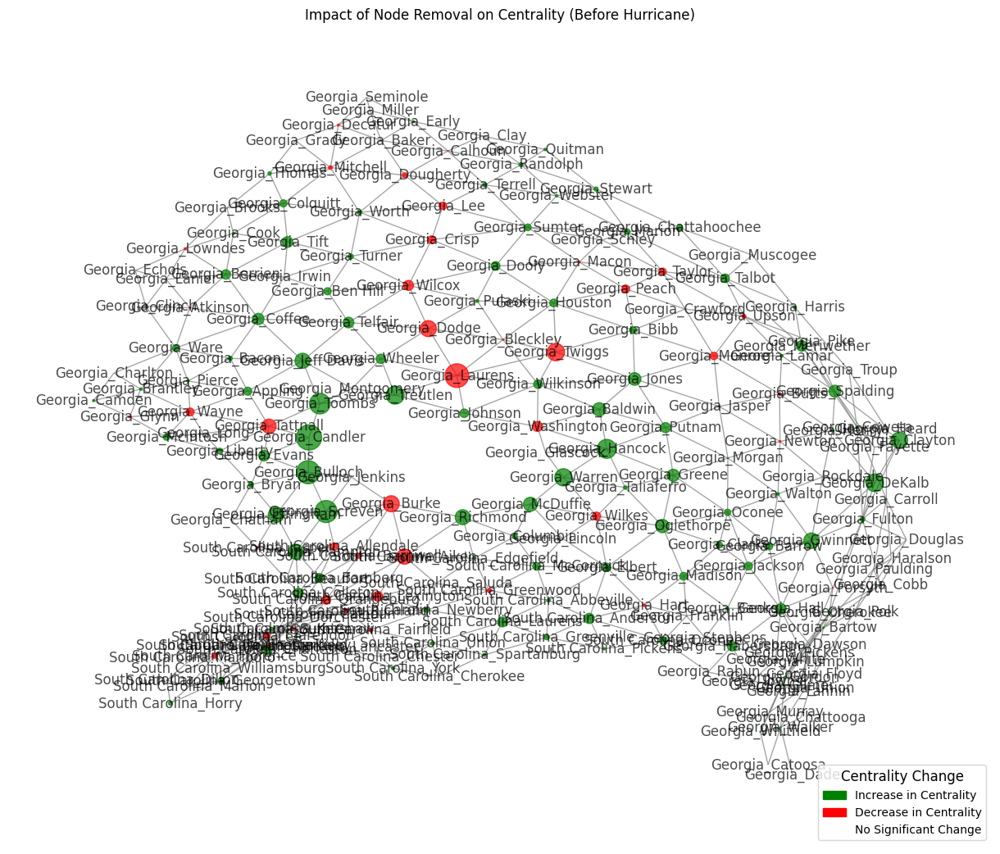

Nodes in the graph before removal: ['Georgia_Appling', 'Georgia_Atkinson', 'Georgia_Bacon', 'Georgia_Baker', 'Georgia_Baldwin', 'Georgia_Banks', 'Georgia_Barrow', 'Georgia_Bartow', 'Georgia_Ben Hill', 'Georgia_Berrien', 'Georgia_Bibb', 'Georgia_Bleckley', 'Georgia_Brantley', 'Georgia_Brooks', 'Georgia_Bryan', 'Georgia_Bulloch', 'Georgia_Burke', 'Georgia_Butts', 'Georgia_Calhoun', 'Georgia_Camden', 'Georgia_Candler', 'Georgia_Carroll', 'Georgia_Catoosa', 'Georgia_Charlton', 'Georgia_Chatham', 'Georgia_Chattahoochee', 'Georgia_Chattooga', 'Georgia_Cherokee', 'Georgia_Clarke', 'Georgia_Clay', 'Georgia_Clayton', 'Georgia_Clinch', 'Georgia_Cobb', 'Georgia_Coffee', 'Georgia_Colquitt', 'Georgia_Columbia', 'Georgia_Cook', 'Georgia_Coweta', 'Georgia_Crawford', 'Georgia_Crisp', 'Georgia_Dade', 'Georgia_Dawson', 'Georgia_Decatur', 'Georgia_DeKalb', 'Georgia_Dodge', 'Georgia_Dooly', 'Georgia_Dougherty', 'Georgia_Douglas', 'Georgia_Early', 'Georgia_Echols', 'Georgia_Effingham', 'Georgia_Elbert', 'G

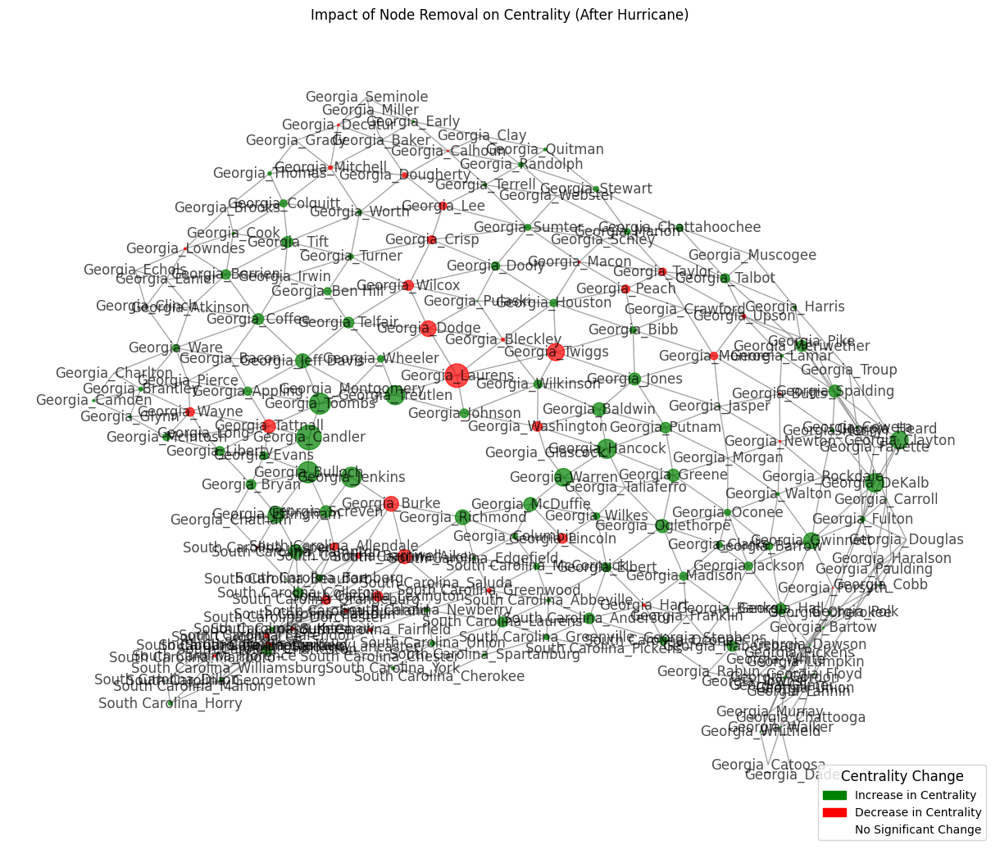

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import json


def check_nodes_removed(graph, nodes_to_remove): # for verification purposes
    for node in nodes_to_remove:
        if node in graph:
            print(f"Node {node} is still in the graph.")
        else:
            print(f"Node {node} has been successfully removed.")

def visualize_node_removal_impact(graph, date_str, nodes_to_remove, pos, title_suffix):
    # Normalize weights and calculate initial centrality
    normalize_weights(graph, date_str)
    initial_centrality = nx.betweenness_centrality(graph, weight='weight')

    print("Nodes in the graph before removal:", list(graph.nodes()))

    graph_removed = graph.copy()
    
    # remove nodes and check if they are removed correctly
    print(f"Removing nodes: {nodes_to_remove}")
    graph_removed.remove_nodes_from(nodes_to_remove)


    print("Nodes in the graph after removal:", list(graph_removed.nodes()))

  
    check_nodes_removed(graph_removed, nodes_to_remove)

    # recalculate centrality after node removal
    simulated_centrality = nx.betweenness_centrality(graph_removed, weight='weight')

    # calculate changes in centrality (handle missing nodes)
    simulated_change = {
        node: simulated_centrality.get(node, 0) - initial_centrality.get(node, 0)
        for node in graph_removed.nodes()  # Use nodes of the removed graph
    }

    # sort and print the top nodes most affected by node removal
    print(f"\nImpact of Removing Nodes {nodes_to_remove} on Centrality ({date_str}):")
    for node, change in sorted(simulated_change.items(), key=lambda x: abs(x[1]), reverse=True)[:10]:
        print(f"{node}: {change:+.4f}")

    # define color changes
    sim_change_color = [
        'green' if simulated_change[node] > 0 else
        'red' if simulated_change[node] < 0 else
        'white'
        for node in graph_removed.nodes()  # Use nodes of the removed graph
    ]

    # simulated size-changes in map
    sim_change_size = [abs(simulated_change[node]) * 5000 for node in graph_removed.nodes()]

    plt.figure(figsize=(12, 10))
    nx.draw(
        graph_removed, pos,
        with_labels=True,
        node_size=sim_change_size,
        node_color=sim_change_color,
        edge_color="gray",
        alpha=0.7
    )

    # define legend
    legend_patches = [
        mpatches.Patch(color='green', label='Increase in Centrality'),
        mpatches.Patch(color='red', label='Decrease in Centrality'),
        mpatches.Patch(color='white', label='No Significant Change'),
    ]

    # add legend 
    plt.legend(
        handles=legend_patches,
        loc='lower right',
        fontsize=10,
        title='Centrality Change',
        title_fontsize=12
    )

    plt.title(f"Impact of Node Removal on Centrality ({title_suffix})")
    plt.show()


nodes_to_remove = ['Georgia_Emanuel', 'Georgia_Jefferson']
pos = nx.spring_layout(nx_ntl, seed=42)
visualize_node_removal_impact(nx_ntl, '2023-09-25', nodes_to_remove, pos, "Before Hurricane")
visualize_node_removal_impact(nx_ntl, '2023-09-30', nodes_to_remove, pos, "After Hurricane")


## Removing an edge in the graph

Edge between Georgia_Emanuel and Georgia_Jefferson has been successfully removed.

Impact of Removing Edges [('Georgia_Emanuel', 'Georgia_Jefferson')] on Centrality (2023-09-25):
Georgia_Jefferson: -0.0480
Georgia_Burke: +0.0388
Georgia_McDuffie: -0.0221
Georgia_Wilkes: -0.0206
Georgia_Johnson: +0.0204
Georgia_Emanuel: -0.0202
Georgia_Richmond: +0.0197
Georgia_Columbia: +0.0140
South Carolina_McCormick: +0.0125
Georgia_Clayton: +0.0093


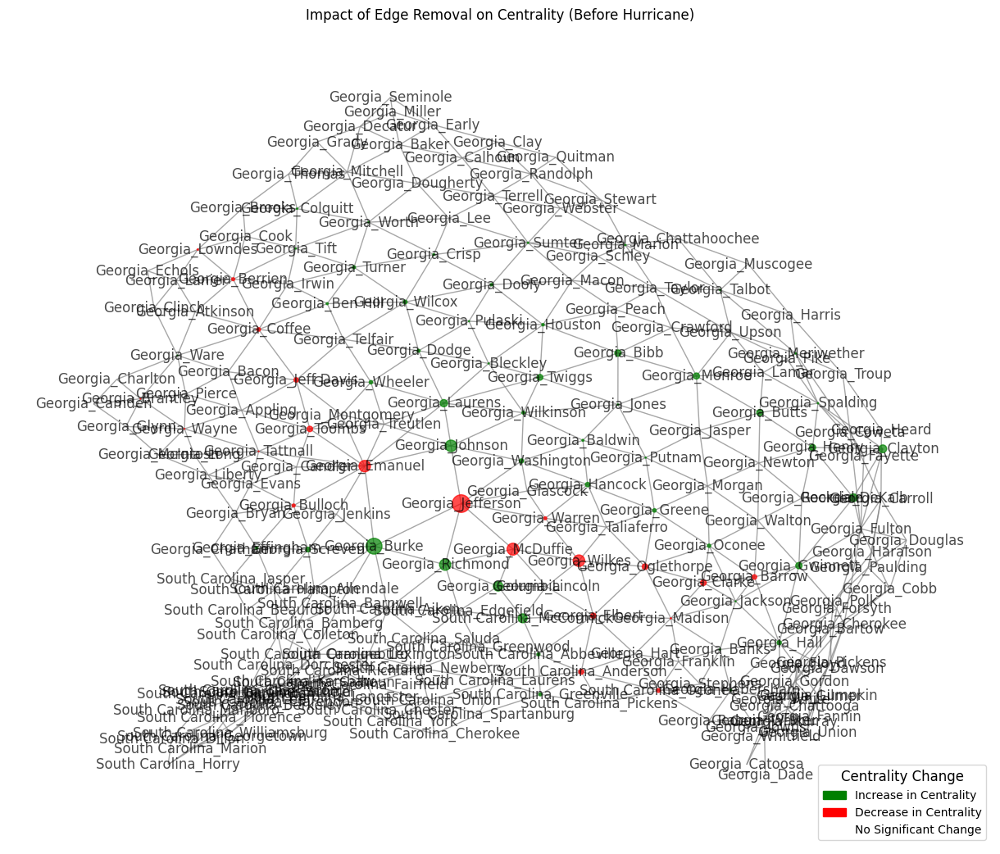

Edge between Georgia_Emanuel and Georgia_Jefferson has been successfully removed.

Impact of Removing Edges [('Georgia_Emanuel', 'Georgia_Jefferson')] on Centrality (2023-09-30):
Georgia_Jefferson: -0.0548
Georgia_Burke: +0.0447
Georgia_McDuffie: -0.0219
Georgia_Richmond: +0.0197
Georgia_Emanuel: -0.0142
Georgia_Johnson: +0.0140
Georgia_Columbia: +0.0140
Georgia_Clayton: +0.0090
Georgia_DeKalb: +0.0090
Georgia_Laurens: +0.0090


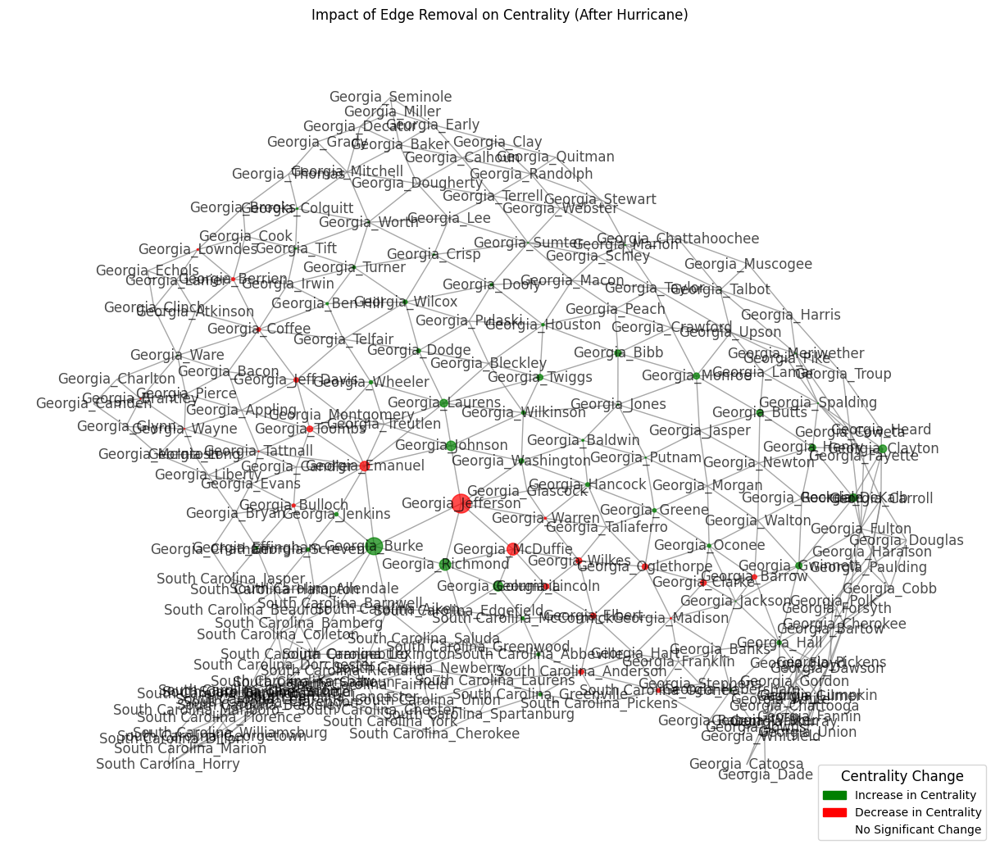

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import json


def check_edges_removed(graph, node1, node2): # for verification purposes
    if graph.has_edge(node1, node2):
        print(f"Edge between {node1} and {node2} is still in the graph.")
    else:
        print(f"Edge between {node1} and {node2} has been successfully removed.")

def visualize_edge_removal_impact(graph, date_str, edges_to_remove, pos, title_suffix):
    # normalize weights and calculate initial centrality
    normalize_weights(graph, date_str)
    initial_centrality = nx.betweenness_centrality(graph, weight='weight')

    # create a copy of the graph and remove specified edges
    graph_removed = graph.copy()
    
    # remove edges specified in the list
    for (node1, node2) in edges_to_remove:
        graph_removed.remove_edge(node1, node2)
        # Check if the edge is removed
        check_edges_removed(graph_removed, node1, node2)

    # recalculate centrality after edge removal
    simulated_centrality = nx.betweenness_centrality(graph_removed, weight='weight')

    # calculate changes in centrality 
    simulated_change = {
        node: simulated_centrality.get(node, 0) - initial_centrality.get(node, 0)
        for node in graph.nodes()
    }

    # sort and print the top nodes most affected by edge removal
    print(f"\nImpact of Removing Edges {edges_to_remove} on Centrality ({date_str}):")
    for node, change in sorted(simulated_change.items(), key=lambda x: abs(x[1]), reverse=True)[:10]:
        print(f"{node}: {change:+.4f}")

    # colors for changes
    sim_change_color = [
        'green' if simulated_change[node] > 0 else
        'red' if simulated_change[node] < 0 else
        'white'
        for node in graph.nodes()
    ]

    # simulate size-changes on map
    sim_change_size = [abs(simulated_change[node]) * 5000 for node in graph.nodes()]

    plt.figure(figsize=(12, 10))
    nx.draw(
        graph_removed, pos,
        with_labels=True,
        node_size=sim_change_size,
        node_color=sim_change_color,
        edge_color="gray",
        alpha=0.7
    )

    # define legend
    legend_patches = [
        mpatches.Patch(color='green', label='Increase in Centrality'),
        mpatches.Patch(color='red', label='Decrease in Centrality'),
        mpatches.Patch(color='white', label='No Significant Change'),
    ]

    # add legend
    plt.legend(
        handles=legend_patches,
        loc='lower right',
        fontsize=10,
        title='Centrality Change',
        title_fontsize=12
    )

    plt.title(f"Impact of Edge Removal on Centrality ({title_suffix})")
    plt.show()


# edged to be removed are defined throgh the nodes they link
edges_to_remove = [('Georgia_Emanuel', 'Georgia_Jefferson')]

# generating positions for visualization
pos = nx.spring_layout(nx_ntl, seed=42)

# generate graphs
visualize_edge_removal_impact(nx_ntl, '2023-09-25', edges_to_remove, pos, "Before Hurricane")
visualize_edge_removal_impact(nx_ntl, '2023-09-30', edges_to_remove, pos, "After Hurricane")


### Edge Removal Heatmap

Edge between Georgia_Emanuel and Georgia_Jefferson has been successfully removed.


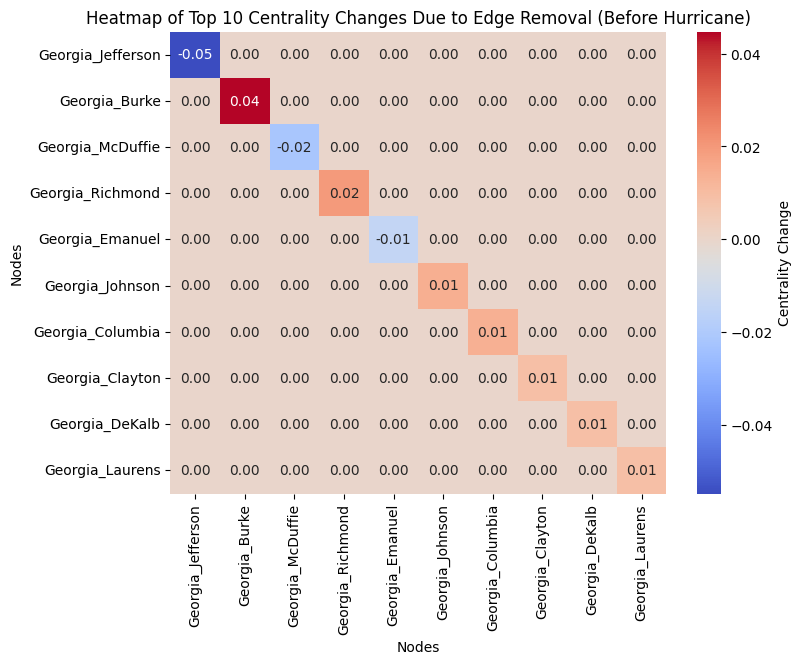

Edge between Georgia_Emanuel and Georgia_Jefferson has been successfully removed.


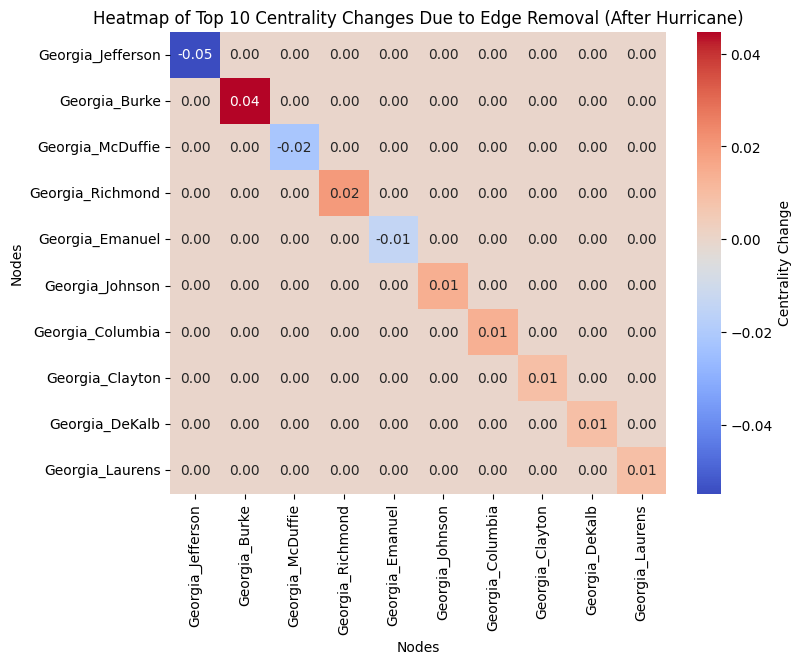

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np


def check_edges_removed(graph, node1, node2): # for verification purposes
    if graph.has_edge(node1, node2):
        print(f"Edge between {node1} and {node2} is still in the graph.")
    else:
        print(f"Edge between {node1} and {node2} has been successfully removed.")


def visualize_edge_removal_impact(graph, date_str, edges_to_remove, title_suffix):
    # normalize weights and calculate initial centrality
    initial_centrality = nx.betweenness_centrality(graph, weight='weight')

    graph_removed = graph.copy()

    for (node1, node2) in edges_to_remove:
        graph_removed.remove_edge(node1, node2)
        check_edges_removed(graph_removed, node1, node2)

    # recalculate centrality after edge removal
    simulated_centrality = nx.betweenness_centrality(graph_removed, weight='weight')

    # changes in centrality calculated
    simulated_change = {
        node: simulated_centrality.get(node, 0) - initial_centrality.get(node, 0)
        for node in graph.nodes()
    }

    # get top N nodes with largest absolute changes
    top_n = 10
    top_changed_nodes = sorted(simulated_change, key=lambda x: abs(simulated_change[x]), reverse=True)[:top_n]
    changes_matrix = np.zeros((len(top_changed_nodes), len(top_changed_nodes)))

    for i, node1 in enumerate(top_changed_nodes):
        for j, node2 in enumerate(top_changed_nodes):
            if node1 == node2:
                changes_matrix[i, j] = simulated_change.get(node1, 0)

    # heatmap
    plt.figure(figsize=(8, 6))
    sns.heatmap(
        changes_matrix,
        xticklabels=top_changed_nodes,
        yticklabels=top_changed_nodes,
        cmap="coolwarm",
        annot=True,
        fmt=".2f",
        cbar_kws={'label': 'Centrality Change'}
    )

    plt.title(f"Heatmap of Top {top_n} Centrality Changes Due to Edge Removal ({title_suffix})")
    plt.xlabel("Nodes")
    plt.ylabel("Nodes")
    plt.show()

# edges to remove
edges_to_remove = [('Georgia_Emanuel', 'Georgia_Jefferson')]

# generate graphs
visualize_edge_removal_impact(nx_ntl, '2023-09-25', edges_to_remove, "Before Hurricane")
visualize_edge_removal_impact(nx_ntl, '2023-09-30', edges_to_remove, "After Hurricane")
